# Projet Python de prédiction des prix du Bitcoin par une analyse de sentiments des tweets sur le bitcoin

Martin Boutier, François Lacarce, François Bertholom

Nous procédons en 3 étapes 

1) Tout d'abord on établit un modèle de classification Bayesien pour obtenir la positivité d'un tweet selon son contenu. 

Ce modèle est construit et entraîné grâce à une base Kaggle contenant 1 600 000 tweets ainsi que leur positivité réelle observée.

Les données de la base Kaggle sont traitées, nettoyées afin d'être conformes aux inputs d'un modèle de classification Bayesien.


2) Ensuite on effectue un scrapping des tweets sur le bitcoin entre 2019 et 2021 pour constituer une base finale solide de 77 000 tweets répondant à certains criètes 
- mention du bitcoin dans le tweet
- nombre de likes et de retweets minimum  (300 likes et 30 retweets)

On prédit alors la positivité de chaque tweet grâce au modèle obtenue en étape 1 (1 si positif et 0 sinon)

3) Enfin, on construit une variable score qui à chaque tweet associe son score en fonction de sa positivité, son nombre de likes et enfin si l'utilisateur a un compte vérifié ou non

On effectue enfin la régression linéaire suivante :

- les variables explicatives sont les tweets sur le bitcoin le jour J, le prix de fermeture du bittoin au jour J 
- la variable cible est le prix du bitcoin à l'ouverture au jour J+2
- cela permettrait en théorie, d'anticiper une hausse ou une baisse du cours du bitcoin pour effectuer du trading intraday au jour J+1 et ainsi faire un bénéfice immédiat à l'ouverture au jour J+2





In [ ]:
pip install snscrape

In [ ]:
import snscrape.modules.twitter as sntwitter


Packages utilisés pour le reste du projet

In [ ]:
import nltk
import pandas as pd
import numpy as np
nltk.download('punkt')
nltk.download('stopwords')
nltk.download('wordnet')
import pandas as pd
import matplotlib.pyplot as plt
import re
from nltk.corpus import stopwords
from nltk.stem.wordnet import WordNetLemmatizer
import pickle
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import train_test_split


# I - Création du modèle de classification des sentiments des tweets en fonction de leur texte 


### A) Importation de la base de données Kaggle pour créer un modèle d'analyse de sentiment des tweets


La base contient 1 600 000 tweets : 800 000 négatifs et 800 000 postifs

https://www.kaggle.com/kazanova/sentiment140
- la base Kaggle sentiment possède des tweets avec une analyse de sentiments 
- la variable label est égale à 0 si le tweet est négatif et 4 si positif
- cette base va servir de base d'entraînement pour le modèle d'analyse de sentiments de nos tweets


In [408]:
#KAGGLE Dataset with tweets and posititivity 0 if not 4 if positive

#Lecture du Dataset
df_raw = pd.read_csv('training.csv', encoding = "ISO-8859-1", header=None)

# definition de nos colonnes
df_raw.columns = ["label", "time", "date", "query", "username", "text"]



ParserError: Error tokenizing data. C error: out of memory

In [409]:
# suppression des colonnes qui ne sous serviront pas
df = df_raw[['label', 'text']]
df_pos = df[df['label'] == 4] # les tweets positifs
df_neg = df[df['label'] == 0] # les tweets négatifs

print(len(df_pos), len(df_neg))
df_pos = df_pos.iloc[:int(len(df_pos)/10)]
df_neg = df_neg.iloc[:int(len(df_neg)/10)]
print(len(df_pos), len(df_neg))
df = pd.concat([df_pos, df_neg])
df

MemoryError: Unable to allocate 12.2 MiB for an array with shape (1, 1600000) and data type int64

# B) Nettoyage des données 

Afin d'alimenter nos données textuelles à un modèle de classification, nous devons d'abord les tokeniser.
La tokenisation est le processus qui consiste à diviser une chaîne de texte unique en une liste de mots individuels, ou tokens.

Python dispose d'une méthode intégrée pour les chaînes de caractères : string.split(), qui divise une chaîne de caractères donnée en une liste basée sur un caractère de séparation.



Construction de notre database pour le modèle, sous forme de liste :
- c'est une liste de tuple
- chaque tuple est une paire du text tokenizé et enfin de la variable target (4 si positif, 0 sinon)

In [ ]:

from nltk.tokenize import TweetTokenizer
# The reduce_len parameter will allow a maximum of 3 consecutive repeating characters, while trimming the rest
# For example, it will tranform the word: 'Helloooooooooo' to: 'Hellooo'

tk = TweetTokenizer(reduce_len=True)

data = []


# Sépration des variables (X) et de la variable target (Y) pour la suite du modèle
X = df['text'].tolist()
Y = df['label'].tolist()

# Building our data list, that is a list of tuples, where each tuple is a pair of the tokenized text
# and its corresponding label

for x, y in zip(X, Y):
    if y == 4:
        data.append((tk.tokenize(x), 1))
    else:
        data.append((tk.tokenize(x), 0))
        

### Nettoyage des tokens


La lemmatisation est le processus qui consiste à réduire les différentes formes d'un mot à une seule forme, par exemple, en réduisant "builds", "building", ou "built" au lemme "build". Cela aidera grandement notre classificateur en traitant toutes les variantes d'un mot donné comme étant des références au mot lemme original. Par exemple, cela évitera d'interpréter "cats" et "cat" comme des entrées complètement différentes.


Une fois le tweet tokenisé il faut nettoyer et enlever les tokens inutiles puis regrouper les tokens survivants en familles
- tous les stopwords sont des mots de liaisons qu'il convient de supprimer pour procéder au NLP


In [ ]:
nltk.download('averaged_perceptron_tagger')
from nltk.tag import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer


def lemmatize_sentence(tokens):
    lemmatizer = WordNetLemmatizer()
    lemmatized_sentence = []
    for word, tag in pos_tag(tokens):
        # First, we will convert the pos_tag output tags to a tag format that the WordNetLemmatizer can interpret
        # In general, if a tag starts with NN, the word is a noun and if it starts with VB, the word is a verb.
        if tag.startswith('NN'):
            pos = 'n'
        elif tag.startswith('VB'):
            pos = 'v'
        else:
            pos = 'a'
        lemmatized_sentence.append(lemmatizer.lemmatize(word, pos))
    return lemmatized_sentence

# Previewing the WordNetLemmatizer() output
print(lemmatize_sentence(data[5][0]))


In [ ]:
import re 
import string


from nltk.corpus import stopwords
STOP_WORDS = stopwords.words('english')

def cleaned(token):
    if token == 'u':
        return 'you'
    if token == 'r':
        return 'are'
    if token == 'some1':
        return 'someone'
    if token == 'yrs':
        return 'years'
    if token == 'hrs':
        return 'hours'
    if token == 'mins':
        return 'minutes'
    if token == 'secs':
        return 'seconds'
    if token == 'pls' or token == 'plz':
        return 'please'
    if token == '2morow':
        return 'tomorrow'
    if token == '2day':
        return 'today'
    if token == '4got' or token == '4gotten':
        return 'forget'
    return token


# fonction finale pour nettoyer les tokens de chaque tweet
 
def remove_noise(tweet_tokens):

    cleaned_tokens = []

    for token, tag in pos_tag(tweet_tokens):
        # On élimine le token si c'est un lien
        token = re.sub('http[s]?://(?:[a-zA-Z]|[0-9]|[$-_@.&+#]|[!*\(\),]|'\
                       '(?:%[0-9a-fA-F][0-9a-fA-F]))+','', token)

        # Suppression du token si c'est une mention 
        token = re.sub("(@[A-Za-z0-9_]+)","", token)

        if tag.startswith("NN"):
            pos = 'n'
        elif tag.startswith('VB'):
            pos = 'v'
        else:
            pos = 'a' # pour adverbe

        lemmatizer = WordNetLemmatizer()
        token = lemmatizer.lemmatize(token, pos)

        cleaned_token = cleaned(token.lower()) # application de la fonction cleaned
        
        # Eliminaton du token si il est trop court, si c'est un signe de ponctuation ou un stopwords
        if cleaned_token not in string.punctuation and len(cleaned_token) > 2:#and cleaned_token not in STOP_WORDS:
            cleaned_tokens.append(cleaned_token)
            
    return cleaned_tokens

# Prevewing the remove_noise() output
#print(remove_noise(data[5][0]))

### Application des fonctions à nos tweets "sales" de la base Kaggle

In [ ]:
cleaned_tokens_list = []

# Removing noise from all the data
for tokens, label in data:
    cleaned_tokens_list.append((remove_noise(tokens), label))


### C) Préparation des données pour le modèle de classificatuion Bayesien




- Nous devons maintenant adapter le format de nos données
- Pour la construction d'un modèle de classification Bayesian il faut que les données soit sous forme de dictionnaire

In [ ]:

final_data = []

def list_to_dict(cleaned_tokens):
    return dict([token, True] for token in cleaned_tokens) # on ajoute à chaque fois "True", pour forcer le passage de list à dict

for tokens, label in cleaned_tokens_list:
    final_data.append((list_to_dict(tokens), label))
    

final_data[:5]

- Nos données ont ensuite besoin d'êtres "mélangées" car elles sont encore classées par label

Les données d'entraînement sont des données utilisées pour construire et entraîner notre modèle de classification.

Les données de test sont des données que notre modèle de classification n'a jamais vues auparavant, utilisées pour évaluer la précision et tester notre modèle de classification.

In [ ]:

import random
random.Random(140).shuffle(final_data)

# Here we decided to split our data as 90% train data and 10% test data

index_sep = int(len(final_data) * 0.9)

train_data = final_data[:index_sep]
test_data = final_data[index_sep:]

### D) Entraînement du modèle

In [ ]:


from nltk import classify
from nltk import NaiveBayesClassifier
classifier = NaiveBayesClassifier.train(train_data)

# Output the model accuracy on the train and test data
print('Accuracy on train data:', classify.accuracy(classifier, train_data))
print('Accuracy on test data:', classify.accuracy(classifier, test_data))

# Output the words that provide the most information about the sentiment of a tweet.
# These are words that are heavily present in one sentiment group and very rarely present in the other group.
print(classifier.show_most_informative_features(20))






### Sauvegarde du modèle


In [ ]:
import pickle
# save the model to disk
filename = 'bayesian_classifier.sav'
pickle.dump(classifier, open(filename, 'wb'))
 
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))



In [ ]:
# load the model from disk
import pickle
filename = 'bayesian_classifier.sav'
classifier = pickle.load(open(filename, 'rb'))

### E) Test du modèle

on peut tester le modèle avec des tweets inventées pour évaluer sa cohérence de manière très rapide

In [ ]:
tweet_test ="I work a lot  for this beautiful project"


test_tokens = remove_noise(tk.tokenize(tweet_test))

print(classifier.classify(dict([token, True] for token in test_tokens)))

In [ ]:
tweet_test ="I work a lot for this project"

test_tokens = remove_noise(tk.tokenize(tweet_test))

print(classifier.classify(dict([token, True] for token in test_tokens)))

# II- Analyse des tweets liés au Bitcoin

### A) Extraction des tweets via du scrapping et le package snscrape

- tweets publiés entre le 01/01/2019 et le 18/12/2021
- un minimum de 300 likes et 30 retweets pour que le tweet soit considéré
- les variables quantitatives retenues sont : le nombre de likes, de followers, de retweets, la date du tweet
- les variables qualitatives retenus sont : le texte, l'utilisateur a t'il un compte vérifié ou non

Les tweets sont enfin sauvegardés dans la base tweets_df

In [ ]:
pip install git+https://github.com/JustAnotherArchivist/snscrape.git

In [ ]:
pip install snscrape

In [ ]:

import snscrape.modules.twitter as sntwitter
import pandas as pd


tweets_list=[]
start_date ='2019-01-01'
end_date='2021-12-19'

# Using TwitterSearchScraper to scrape data and append tweets to list
for i,tweet in enumerate(sntwitter.TwitterSearchScraper(f'Bitcoin since:2019-01-01 until:2021-12-19 min_faves:300 min_retweets:30').get_items()):
    if i>100000:
        break
    tweets_list.append([tweet.date, tweet.content, tweet.user.username,tweet.hashtags,tweet.likeCount,tweet.retweetCount,tweet.user.followersCount,tweet.user.verified])

# Creating a dataframe from the tweets list above 
tweets_df = pd.DataFrame(tweets_list, columns=['tweet_date','tweet_text', 'tweet_user','tweet_hashtags','tweet_likes','tweet_retweets','tweet_user_followers','user_verified'])

tweets_df['tweet_date']= tweets_df['tweet_date'].dt.tz_localize(None)


 On conserve que les tweets en anglais
 

In [ ]:
from langdetect import detect
def detect_en(text):
    try:
        return detect(text) == 'en'
    except:
        return False

tweets_df= tweets_df[tweets_df['tweet_text'].apply(detect_en)]
tweets_df.reset_index(drop =True,inplace=True)
tweets_df


In [ ]:
### removing hours and minutes from the date column

tweets_df['tweet_date'] = tweets_df['tweet_date'].dt.date
tweets_df

In [ ]:
### sauvegarde de la base
tweets_df.to_excel('tweets_brut_final.xlsx')

In [ ]:
tweets_df.drop(['Unnamed: 0','positivity'],axis=1,inplace=True)


In [20]:
tweets_df.to_excel('tweets.xlsx')

### B) Application du modèle de classification aux tweets

- On applique le modèle concu en étape 1 sur notre base de tweets
- la colonne positivity est binaire : 1 si le tweet est positif et 0 sinon
- on sauvegarde ensuite la base dans notre répertoire


In [21]:
tweets_df['positivity']=np.nan

tweets_df.reset_index(drop =True,inplace=True)
for i in range (len(tweets_df)):
    tweet = tweets_df.iloc[i][1]
    tweet = str(tweet)
    print(tweet)
    custom_tokens = remove_noise(tk.tokenize(tweet))
    tweets_df['positivity'][i]=classifier.classify(dict([token, True] for token in custom_tokens))
    print( tweets_df['positivity'][i])

#tweets_df.to_excel('tweets_2019_2020_2021_NLP_analysis.xlsx')


Will #bitcoin continue to lead the market forever or will certain #altcoins decouple? 

If so which ones? 🤔👇
1.0
TAKE NOTICE how #bitcoin melted right through the 50k and 40k levels during the May crash as opposed to what it’s doing now. https://t.co/paDwrTs17h
0.0
Want to protect your wealth? Buy #bitcoin 
Want to get rich AF? Buy #altcoins
1.0
#Bitcoin Facts https://t.co/DW4RWjKBBx
1.0
📣INVESTOR ANNOUNCEMENT📣

- Andre Faith Bitcoin [23k YT subs]
- Davos Crypto [27k TW follower]
- Kong BTC [38k TW follower]
- Crypto Rain [21k YT subs]
- Prestito Crypto [11k YT subs]

Let’s go, #VARRIORS 🚀 https://t.co/Aox742PHW7
1.0
Bitcoin Fear and Greed Index is 24 - Fear
Current price: $46,773 https://t.co/q1HEUd58mo
1.0
Sometimes I think I should take a break from making content and just relax and take time for myself. Then I wake up and I feel the sudden urge &amp; it goes..

TODAY FOR THE #BITCOIN  PRICE!!!
0.0
In interview with Roger Stone tonight, Alex Jones puts on a 1-minute master class in 

<ipython-input-21-b7b2fe76d562>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tweets_df['positivity'][i]=classifier.classify(dict([token, True] for token in custom_tokens))


0.0
. @PeterSchiff on #Bitcoin https://t.co/r45yzL6iCl
0.0
HODL #bitcoin https://t.co/yJgf6N0rMD
0.0
The reason for current extended sell-off, short 🧵👇

Asia’s largest exchange, Huobi, has stopped related trading in China. #Bitcoin has been flowing from Asia to the US and Europe for some time. https://t.co/2kweVvgSrB
1.0
I expect #bitcoin will be $300,000 next year 🔥🚀
0.0
Demographics that should "get" #Bitcoin but very often do not:

- libertarians (care about freedom)

- goldbugs (worry about inflation)

- silicon valley (understand technology network effects)

Others?
1.0
I only tip in crypto.  Thanks Manel for being such a good server. Paris is my new favorite town. #bitcoin https://t.co/VC2ZowpIQh
1.0
@Bitboy_Crypto Don't wait to buy #bitcoin. Buy #bitcoin and wait.
0.0
We have 3 options:

1. Raise rates, crush the economy
2. Keep printing, face hyperinflation
3. Print, buy #bitcoin, save the 🇺🇸

I say option three. Use the bad money to buy good money. Put #BTC on the balance shee

In [25]:
### quelques vérifications 
print(tweets_df['positivity'].unique())
print(tweets_df['positivity'].mean())

[1. 0.]
0.5114259462343282


In [26]:
## sauvegarde de la base avec les tweets et leur positivité présumée

tweets_df.to_excel('tweets_NLP.xlsx')

# III) Prédiction du prix du bitcoin

nous allons dans cette ultime étape essayer de construire un modèle permettant de prédire le prix du bitcoin dans un avenir très proche (J+2) grâce à l'analyse de tweets concernant le bitcoin et le prix du bitcoin au jour J


### A) Importation  et préparation des données nécessaires

on importe :
- les tweets qu'on a scrappés, analysés et sauvegardés
- les prix du bitcoin qu'on a obtenus sur le site de yahoo finance sous forme de CSV


In [51]:
## importing tweets

def importing_data(path):
    path =str(path)
    data = pd.read_excel(path)
    data.drop('Unnamed: 0',axis=1,inplace=True)
    data['tweet_date'] = pd.to_datetime(data['tweet_date']).dt.date
    return(data)


tweets_df = importing_data('tweets_NLP.xlsx')


### importing bitcoin price 

def bitcoin_price(path):
    path = str(path)
    bitcoin_price = pd.read_csv(path)
    bitcoin_price.set_index('Date',inplace=True)
    bitcoin_price.sort_values('Date',ascending = False,inplace=True)
    bitcoin_price.index = pd.to_datetime(bitcoin_price.index).tz_localize('Etc/UCT')
    return(bitcoin_price)

bitcoin_price = bitcoin_price('BTC-USD_2019_2020_2021.csv')



In [52]:
tweets_df

,tweet_date,tweet_text,tweet_user,tweet_hashtags,tweet_likes,tweet_retweets,tweet_user_followers,user_verified,positivity
0,2021-12-18,Will #bitcoin continue to lead the market fore...,CoinMarketCap,"['bitcoin', 'altcoins']",2488,471,4301013,True,1
1,2021-12-18,TAKE NOTICE how #bitcoin melted right through ...,Bobby_Axel_Rod,['bitcoin'],938,70,8468,False,0
2,2021-12-18,Want to protect your wealth? Buy #bitcoin \nWa...,TheCryptoLark,"['bitcoin', 'altcoins']",2529,296,800613,True,1
3,2021-12-18,#Bitcoin Facts https://t.co/DW4RWjKBBx,CedYoungelman,['Bitcoin'],1778,278,9623,False,1
4,2021-12-18,📣INVESTOR ANNOUNCEMENT📣\n\n- Andre Faith Bitco...,VLaunchCOM,['VARRIORS'],13238,8706,229586,False,1
...,...,...,...,...,...,...,...,...,...
67473,2019-01-01,BREAKING: Bitcoin survived 2018.,APompliano,NaN,4388,619,1410336,True,1
67474,2019-01-01,2018 was the worst year for Bitcoin.\n2018 was...,lopp,NaN,1000,265,374449,True,0
67475,2019-01-01,"Don't look at ATH's, look at yearly lows. That...",Ben__Af,"['btc', 'Crypto', 'Bitcoin']",5993,2047,3437,False,1
67476,2019-01-01,Bitcoin is even more compelling today than it ...,APompliano,NaN,1765,235,1410336,True,1


On ajuste les données pour le modèle

In [53]:
tweets_df['user_verified'] =tweets_df['user_verified'].replace(True,1.2)
tweets_df['user_verified'] =tweets_df['user_verified'].replace(False,0.8)
# cela va permettre de mettre en valuer les tweets avec un compte vérifiés par rapport à ceux qui ne sont pas vérifiés

tweets_df.drop_duplicates
tweets_df.set_index('tweet_date',inplace=True)
tweets_df.index.names=['Date']
tweets_df.index = pd.to_datetime(tweets_df.index)


In [54]:
tweets_df

,tweet_text,tweet_user,tweet_hashtags,tweet_likes,tweet_retweets,tweet_user_followers,user_verified,positivity
Date,,,,,,,,
2021-12-18,Will #bitcoin continue to lead the market fore...,CoinMarketCap,"['bitcoin', 'altcoins']",2488,471,4301013,1.2,1
2021-12-18,TAKE NOTICE how #bitcoin melted right through ...,Bobby_Axel_Rod,['bitcoin'],938,70,8468,0.8,0
2021-12-18,Want to protect your wealth? Buy #bitcoin \nWa...,TheCryptoLark,"['bitcoin', 'altcoins']",2529,296,800613,1.2,1
2021-12-18,#Bitcoin Facts https://t.co/DW4RWjKBBx,CedYoungelman,['Bitcoin'],1778,278,9623,0.8,1
2021-12-18,📣INVESTOR ANNOUNCEMENT📣\n\n- Andre Faith Bitco...,VLaunchCOM,['VARRIORS'],13238,8706,229586,0.8,1
...,...,...,...,...,...,...,...,...
2019-01-01,BREAKING: Bitcoin survived 2018.,APompliano,NaN,4388,619,1410336,1.2,1
2019-01-01,2018 was the worst year for Bitcoin.\n2018 was...,lopp,NaN,1000,265,374449,1.2,0
2019-01-01,"Don't look at ATH's, look at yearly lows. That...",Ben__Af,"['btc', 'Crypto', 'Bitcoin']",5993,2047,3437,0.8,1


### B) Création des variables pour le modèle

Pour la modélisation, on construit des variables issues de l'analyse de nos tweets
C'est une sorte de scoring de chaque tweet
le score d'un tweet est fonction de :
- sa positivité
- son nombre de likes
- si l'utilisateur est vérifié ou non


In [55]:
### creating features for the model
tweets_df['score'] = tweets_df['positivity']*tweets_df['user_verified']* tweets_df['tweet_likes']
tweets_df

,tweet_text,tweet_user,tweet_hashtags,tweet_likes,tweet_retweets,tweet_user_followers,user_verified,positivity,score
Date,,,,,,,,,
2021-12-18,Will #bitcoin continue to lead the market fore...,CoinMarketCap,"['bitcoin', 'altcoins']",2488,471,4301013,1.2,1,2985.6
2021-12-18,TAKE NOTICE how #bitcoin melted right through ...,Bobby_Axel_Rod,['bitcoin'],938,70,8468,0.8,0,0.0
2021-12-18,Want to protect your wealth? Buy #bitcoin \nWa...,TheCryptoLark,"['bitcoin', 'altcoins']",2529,296,800613,1.2,1,3034.8
2021-12-18,#Bitcoin Facts https://t.co/DW4RWjKBBx,CedYoungelman,['Bitcoin'],1778,278,9623,0.8,1,1422.4
2021-12-18,📣INVESTOR ANNOUNCEMENT📣\n\n- Andre Faith Bitco...,VLaunchCOM,['VARRIORS'],13238,8706,229586,0.8,1,10590.4
...,...,...,...,...,...,...,...,...,...
2019-01-01,BREAKING: Bitcoin survived 2018.,APompliano,NaN,4388,619,1410336,1.2,1,5265.6
2019-01-01,2018 was the worst year for Bitcoin.\n2018 was...,lopp,NaN,1000,265,374449,1.2,0,0.0
2019-01-01,"Don't look at ATH's, look at yearly lows. That...",Ben__Af,"['btc', 'Crypto', 'Bitcoin']",5993,2047,3437,0.8,1,4794.4


On calcule ensuite la variable du prix d'ouvertute du bitcoin qui, quand on est au jour J nous donne le prix réel qu'aura le bitcoin à l'ouverture ,au jour J+2.
Ceci est possible car ce sont des données historiques

In [373]:
### shaping bitcoin price for model
bitcoin_price['next_open'] = bitcoin_price['Open'].shift(2)  # our future target variable
bitcoin_price

,Open,High,Low,Close,Adj Close,Volume,next_open
Date,,,,,,,
2021-12-19 00:00:00+00:00,46853.867188,48089.664063,46502.953125,46707.015625,46707.015625,25154053861,NaN
2021-12-18 00:00:00+00:00,46219.253906,47313.828125,45598.441406,46848.777344,46848.777344,26098292690,NaN
2021-12-17 00:00:00+00:00,47653.730469,48004.894531,45618.214844,46202.144531,46202.144531,32902725329,46853.867188
2021-12-16 00:00:00+00:00,48900.464844,49425.574219,47529.878906,47665.425781,47665.425781,27268150947,46219.253906
2021-12-15 00:00:00+00:00,48379.753906,49473.957031,46671.964844,48896.722656,48896.722656,36541828520,47653.730469
...,...,...,...,...,...,...,...
2019-01-05 00:00:00+00:00,3851.973877,3904.903076,3836.900146,3845.194580,3845.194580,5137609824,4078.584961
2019-01-04 00:00:00+00:00,3832.040039,3865.934570,3783.853760,3857.717529,3857.717529,4847965467,3836.519043
2019-01-03 00:00:00+00:00,3931.048584,3935.685059,3826.222900,3836.741211,3836.741211,4530215219,3851.973877


On prépare ensuite les données pour le modèle
- on regroupe les tweets par jour et on fait donc une moyenne sur chaque jour des scores des tweets concernant le bitcoin

In [374]:
### data for model 

data = tweets_df.groupby(tweets_df.index)[['score']].mean()
data.sort_index(ascending=False)
data.index = pd.to_datetime(data.index).tz_localize('Etc/UCT') # pour être conforme avec les dates de la base bitcoin price

## final data for model
data = pd.merge(data,bitcoin_price,left_index=True,right_index=True)

In [375]:
data

,score,Open,High,Low,Close,Adj Close,Volume,next_open
Date,,,,,,,,
2019-01-01 00:00:00+00:00,1234.307692,3746.713379,3850.913818,3707.231201,3843.520020,3843.520020,4324200990,3931.048584
2019-01-02 00:00:00+00:00,666.430769,3849.216309,3947.981201,3817.409424,3943.409424,3943.409424,5244856836,3832.040039
2019-01-03 00:00:00+00:00,1200.675000,3931.048584,3935.685059,3826.222900,3836.741211,3836.741211,4530215219,3851.973877
2019-01-04 00:00:00+00:00,227.200000,3832.040039,3865.934570,3783.853760,3857.717529,3857.717529,4847965467,3836.519043
2019-01-05 00:00:00+00:00,527.657143,3851.973877,3904.903076,3836.900146,3845.194580,3845.194580,5137609824,4078.584961
...,...,...,...,...,...,...,...,...
2021-12-14 00:00:00+00:00,1061.642424,46709.824219,48431.398438,46424.496094,46612.632813,46612.632813,34638619079,48900.464844
2021-12-15 00:00:00+00:00,1180.205714,48379.753906,49473.957031,46671.964844,48896.722656,48896.722656,36541828520,47653.730469
2021-12-16 00:00:00+00:00,1546.910092,48900.464844,49425.574219,47529.878906,47665.425781,47665.425781,27268150947,46219.253906


### C) Entrainement du modèle
On va procéder ici à une régression 
- les variables explicatives sont les tweets sur le bitcoin le jour J, le prix de fermeture du bictoin au jour J 
- la variable cible est le prix du bitcoin à l'ouverture au jour J+2
- cela permettrait en théorie, d'anticiper une hausse ou une baisse du cours du bitcoin pour effectuer du trading intraday au jour J+1 et ainsi faire un bénéfice immédiat à l'ouverture au jour J+2

In [376]:
X = data[['score','Close']].copy() # les variables explicatives
Y = pd.DataFrame({'Next_Open':data['next_open']}) # la variable target
Y.dropna(inplace=True)
Y['Next_Open'] = Y['Next_Open'].astype(int)
X.drop(X.tail(1).index,inplace=True)   # on supprime la dernière ligne de X car comme Y est au jour J+2, X contient une ligne de plus que Y


In [400]:
import numpy as np
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation


X_train, X_test, y_train, y_test = train_test_split(X,Y, test_size=0.4) # 80% training and 20% test
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

lm = LinearRegression()
lm.fit(X_train,y_train)

y_pred= lm.predict(X_test)
result = y_test.copy()

result['pred'] = y_pred
result.sort_index(inplace=True)


print(r2_score(y_test, y_pred), mean_absolute_error(y_test, y_pred), np.sqrt(mean_squared_error(y_test, y_pred)))
print(lm.coef_)


0.9966558120832388 602.4023105717549 1104.183581141737
[[0.09701344 0.99625582]]


### Sauvegarde du modèle dans le répertoire local

In [401]:
import pickle
# save the model to disk
filename = 'finalized_model.sav'
pickle.dump(lm, open(filename, 'wb'))
 
# load the model from disk
loaded_model = pickle.load(open(filename, 'rb'))


### Analyse des résultats

In [402]:
y_pred= lm.predict(X_test)


result = y_test.copy()
result['pred'] = y_pred
result.sort_index(inplace=True)

lm.coef_

print(r2_score(y_test, y_pred), mean_absolute_error(y_test, y_pred), np.sqrt(mean_squared_error(y_test, y_pred)))
print(lm.coef_)


0.9966558120832388 602.4023105717549 1104.183581141737
[[0.09701344 0.99625582]]


In [403]:
## les coefficients de la régression sont 

print ('le coef des scores des tweets  est ',lm.coef_[0][0])
print('le coef du close du jour J est ',lm.coef_[0][1])

print( 'erreur absolue moyenne de prédiction est',mean_absolute_error(y_test, y_pred))



le coef des scores des tweets  est  0.09701344404629922
le coef du close du jour J est  0.9962558156454473
erreur absolue moyenne de prédiction est 602.4023105717549


### Graphique des résultats

<AxesSubplot:xlabel='Date'>

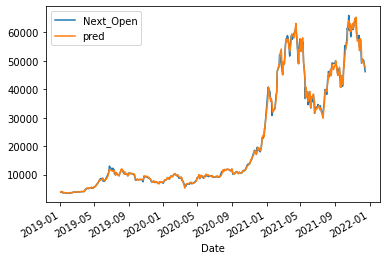

In [404]:
result.plot()

In [405]:
print(result)
print(mean_absolute_error(y_test, y_pred))

                           Next_Open          pred
Date                                              
2019-01-04 00:00:00+00:00       3836   3903.642185
2019-01-07 00:00:00+00:00       4031   4140.483555
2019-01-10 00:00:00+00:00       3686   3733.581215
2019-01-11 00:00:00+00:00       3658   3895.934873
2019-01-12 00:00:00+00:00       3557   3729.523956
...                              ...           ...
2021-12-03 00:00:00+00:00      49201  53538.428233
2021-12-04 00:00:00+00:00      49413  49224.856798
2021-12-06 00:00:00+00:00      50667  50540.050552
2021-12-11 00:00:00+00:00      50114  49334.601607
2021-12-16 00:00:00+00:00      46219  47675.355923

[433 rows x 2 columns]
602.4023105717549
